# **Step 1 | Python Library**

In [1]:
! pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 40.7 MB/s eta 0:00:0000:01
  Attempting uninstall: keras
    Found existing installation: keras 3.2.1
    Uninstalling keras-3.2.1:
      Successfully uninstalled keras-3.2.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.


## **1.1 | Import Libraries**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import itertools
import splitfolders
import pathlib
import glob

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Layer, Flatten, Dense, Activation, Dropout, Input
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import confusion_matrix, classification_report

import os
import random
import warnings
warnings.filterwarnings('ignore')

2024-05-25 12:19:23.872224: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-25 12:19:23.872321: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-25 12:19:23.979561: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# **Step 2 | Data**

## **2.1 | Count Data and Classes**

In [3]:
path = '/kaggle/input/momee-dataset/momee_dataset/train'

class_names = sorted(os.listdir(path))
n_classes = len(class_names)
print(f"Class Names: \n{class_names}")
print(f"Total Number of Classes : {n_classes}")

Class Names: 
['baby_bed', 'baby_car_seat', 'baby_folding_fence', 'bathtub', 'booster_seats', 'bouncer', 'breast_pump', 'carrier', 'earmuffs', 'ride_ons', 'rocking_horse', 'sterilizer', 'stroller', 'walkers']
Total Number of Classes : 14


In [4]:
class_dis = [len(os.listdir(path + f"/{name}")) for name in class_names]
print(f"Class Distribution : \n{class_dis}")

Class Distribution : 
[1200, 1200, 1200, 1200, 1200, 1200, 1200, 1200, 1200, 1200, 1200, 1200, 1200, 1200]


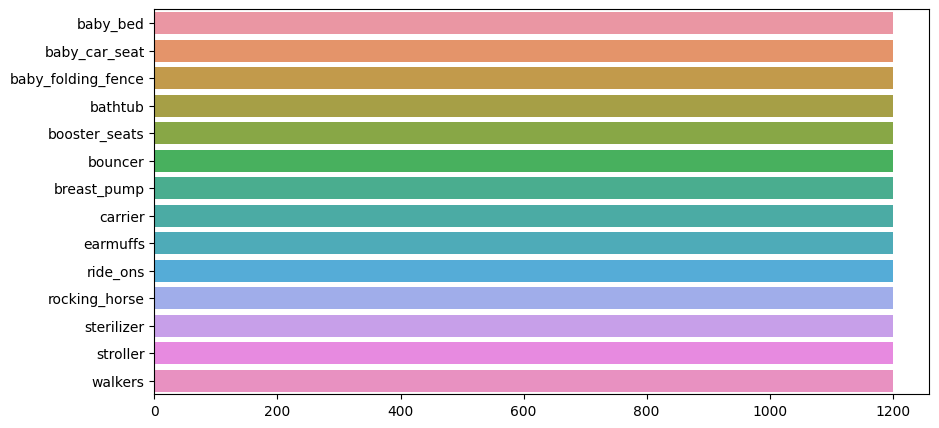

In [5]:
plt.figure(figsize=(10,5))
sns.barplot(y=class_names, x=class_dis, orient='h')
plt.xticks()
plt.show()

In [6]:
path = '/kaggle/input/momee-dataset/momee_dataset/val'

class_names = sorted(os.listdir(path))
n_classes = len(class_names)

class_dis = [len(os.listdir(path + f"/{name}")) for name in class_names]
print(f"Class Distribution : \n{class_dis}")

Class Distribution : 
[300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300, 300]


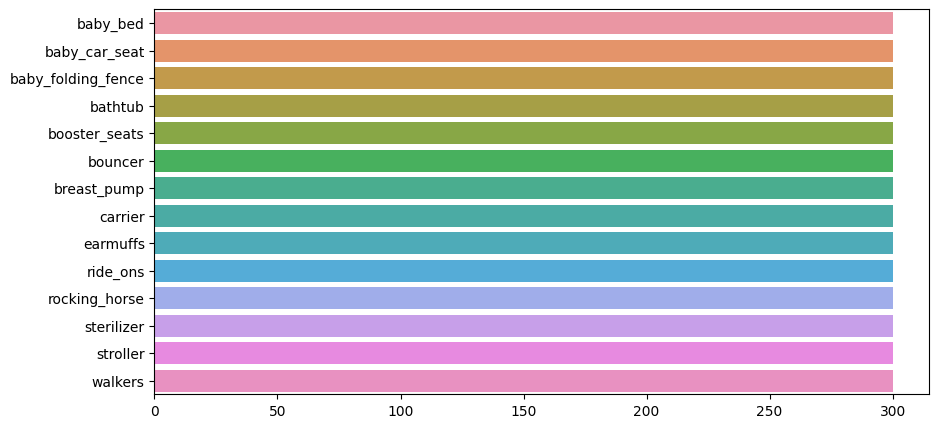

In [7]:
plt.figure(figsize=(10,5))
sns.barplot(y=class_names, x=class_dis, orient='h')
plt.xticks()
plt.show()

## **2.2 | Data Generator**

In [8]:
train_dir='/kaggle/input/momee-dataset/momee_dataset/train'
validation_dir='/kaggle/input/momee-dataset/momee_dataset/val'

train_datagen = ImageDataGenerator(rescale = 1.0/255.,
                                   zoom_range=0.2,
                                   rotation_range=20,
                                   brightness_range=[0.2,1.0],
                                   horizontal_flip=True)

validation_datagen = ImageDataGenerator(rescale=1.0/255.)

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size = (224, 224),
                                                    batch_size = 32,
                                                    class_mode='categorical',
                                                    shuffle=True)

validation_generator = validation_datagen.flow_from_directory(validation_dir,
                                                              target_size = (224, 224),
                                                              batch_size = 32, 
                                                              class_mode='categorical',
                                                              shuffle=False)

Found 16800 images belonging to 14 classes.
Found 4200 images belonging to 14 classes.


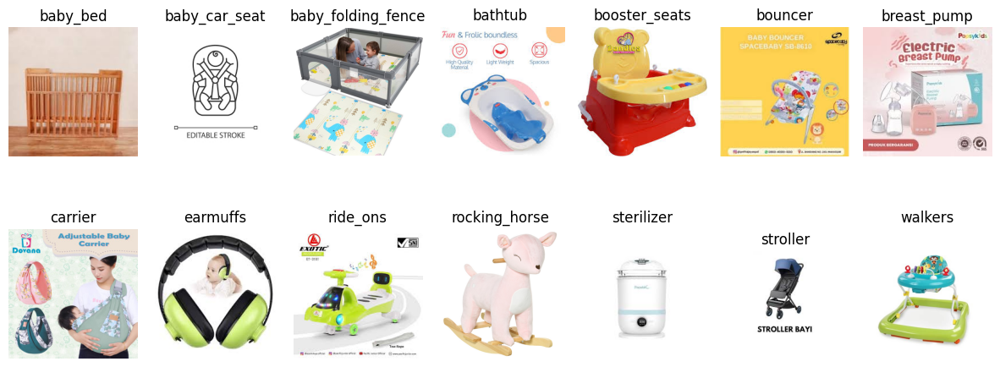

In [9]:
def show_image_per_class(directory, classes):
    num_classes = len(classes)
    num_rows = 7
    num_cols = 7

    plt.figure(figsize=(15, num_rows * 3))
    for i, class_name in enumerate(classes[:num_rows * num_cols]):
        class_dir = os.path.join(directory, class_name)
        img_file = random.choice(os.listdir(class_dir))
        img_path = os.path.join(class_dir, img_file)
        img = plt.imread(img_path)
        plt.subplot(num_rows, num_cols, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
    
    plt.subplots_adjust(wspace=0.1, hspace=0.3)
    plt.show()

show_image_per_class(train_dir, class_names)


In [10]:
def Show_Images(target_gen):
    batch_images, batch_labels = next(target_gen)

    class_labels = list(target_gen.class_indices.keys())

    plt.figure(figsize=(20, 20))
    for n, i in enumerate(list(np.random.randint(0, len(batch_images), 16))):
        plt.subplot(4, 4, n + 1)
        plt.imshow(batch_images[i])
        plt.title(class_labels[np.argmax(batch_labels[i])])
        plt.axis('off')
    plt.show()

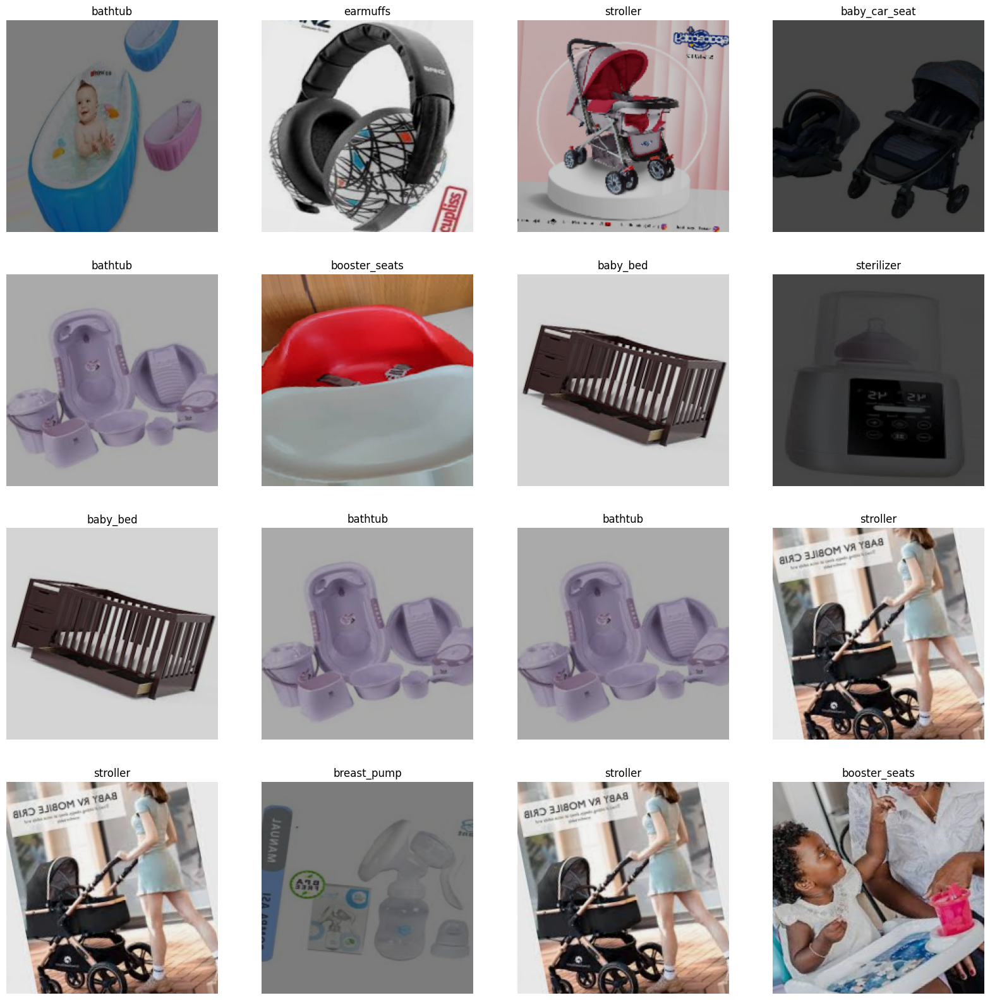

In [11]:
Show_Images(train_generator)

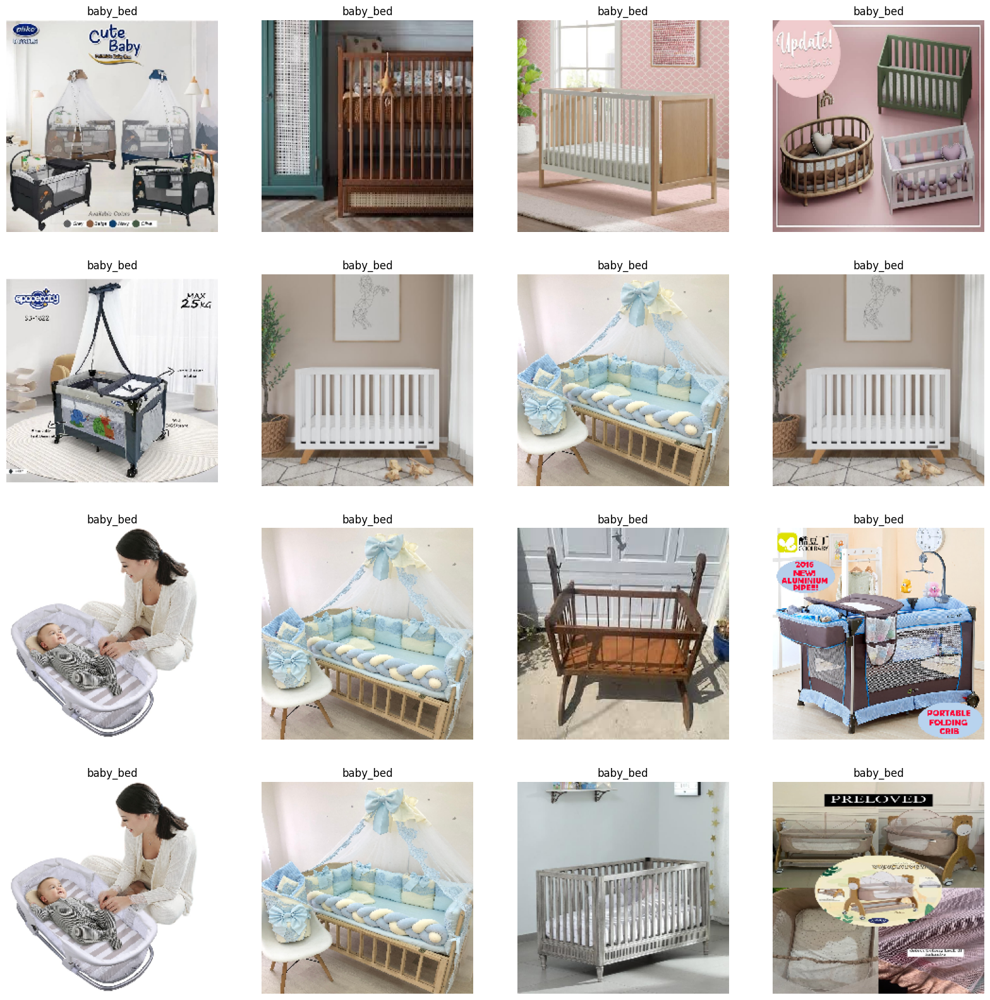

In [12]:
Show_Images(validation_generator)

# **Step 3 | Modelling**

## **3.1 | Add MobileNetV2 Model**

In [13]:
pre_trained_model = MobileNetV2(weights="imagenet",
                                include_top=False,
                                input_tensor=Input(shape=(224, 224, 3)))

for layer in pre_trained_model.layers:
    layer.trainable = False

model = Sequential()
model.add(pre_trained_model)
model.add(Conv2D(128, (3, 3), activation="relu"))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten(name="flatten"))
model.add(Dropout(0.2))
model.add(Dense(128, activation="relu"))
model.add(Dense(14, activation='softmax'))

model.summary()

9406464/9406464 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 conv2d (Conv2D)             (None, 5, 5, 128)         1474688   
                                                                 
 max_pooling2d (MaxPooling2  (None, 2, 2, 128)         0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                           

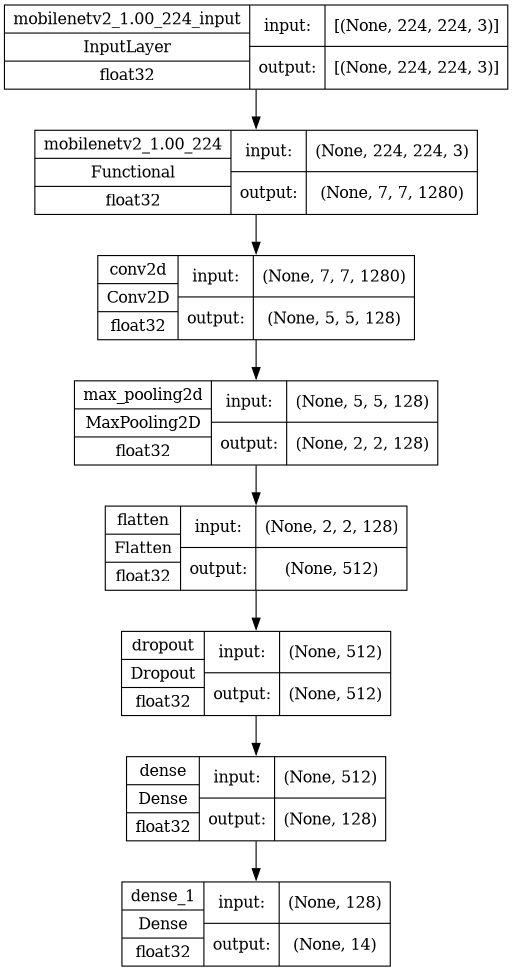

In [14]:
tf.keras.utils.plot_model(model,
                          to_file='model.png',
                          show_shapes=True,
                          show_layer_names=True,
                          show_dtype=True,dpi=80)

In [15]:
from keras.callbacks import ModelCheckpoint
accuracy_threshold = 0.98
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if logs.get('accuracy') > accuracy_threshold and logs.get('val_accuracy') > accuracy_threshold:
      print('\nFor Epoch', epoch, '\nAccuracy has reach = %2.2f%%' %(logs['accuracy']*100), 'training has been stopped.')
      self.model.stop_training=True

callback=myCallback()

In [16]:
model_name = "model_checkpoint.h5"

checkpoint = ModelCheckpoint(model_name,
                             monitor="val_accuracy",
                             mode="max",
                             save_best_only=True,
                             verbose=1)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', 
                              patience=3, 
                              factor=0.5,
                              min_lr=1e-6)

In [17]:
optimizer = Adam(learning_rate=0.001)

model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy']
              )

In [18]:
num_epochs = 50

history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs = num_epochs,
                    verbose = 1,
                    callbacks = [callback, checkpoint, reduce_lr])

Epoch 1/50


I0000 00:00:1716639604.573219     138 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


525/525 [==============================] - ETA: 0s - loss: 0.9334 - accuracy: 0.7239
Epoch 1: val_accuracy improved from -inf to 0.86238, saving model to model_checkpoint.h5
525/525 [==============================] - 308s 572ms/step - loss: 0.9334 - accuracy: 0.7239 - val_loss: 0.4487 - val_accuracy: 0.8624 - lr: 0.0010
Epoch 2/50
525/525 [==============================] - ETA: 0s - loss: 0.5915 - accuracy: 0.8185
Epoch 2: val_accuracy improved from 0.86238 to 0.87667, saving model to model_checkpoint.h5
525/525 [==============================] - 254s 483ms/step - loss: 0.5915 - accuracy: 0.8185 - val_loss: 0.4261 - val_accuracy: 0.8767 - lr: 0.0010
Epoch 3/50
525/525 [==============================] - ETA: 0s - loss: 0.5070 - accuracy: 0.8489
Epoch 3: val_accuracy improved from 0.87667 to 0.88048, saving model to model_checkpoint.h5
525/525 [==============================] - 255s 485ms/step - loss: 0.5070 - accuracy: 0.8489 - val_loss: 0.4020 - val_accuracy: 0.8805 - lr: 0.0010
Epoch 

## **3.2 | Plot the Result of Training**

In [19]:
training_history = history.history
training_df = pd.DataFrame(training_history)
print(training_df.tail())

        loss  accuracy  val_loss  val_accuracy        lr
45  0.105581  0.966726  0.241967      0.940000  0.000008
46  0.097060  0.969107  0.242546      0.940238  0.000004
47  0.100633  0.968690  0.242483      0.939762  0.000004
48  0.109476  0.966845  0.243204      0.939762  0.000004
49  0.095216  0.968631  0.243129      0.939762  0.000002


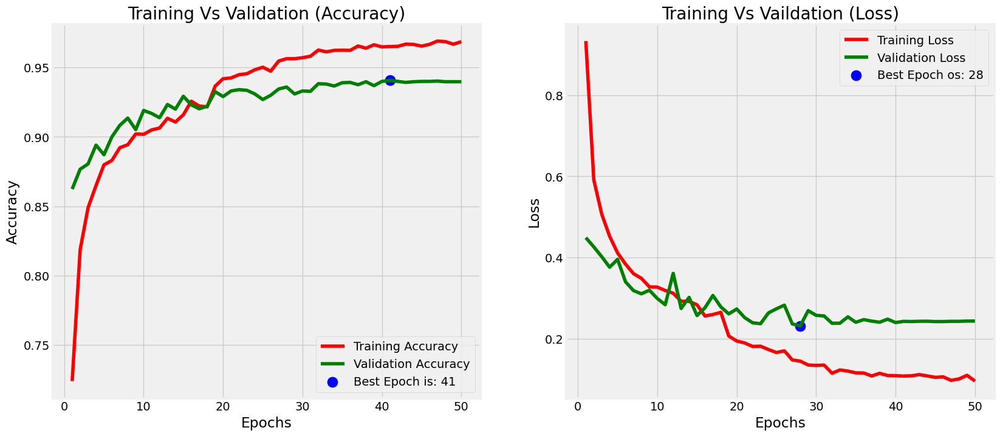

In [20]:
train_acc = history.history['accuracy']
train_loss = history.history['loss']

val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

index_loss = np.argmin(val_loss)
index_acc= np.argmax(val_acc)

val_lowest= val_loss[index_loss]
val_highest = val_acc[index_acc]

epochs= [i+1 for i in range(len(train_acc))]
acc_label = f"Best Epoch is: {str(index_acc +1)}"
loss_label = f"Best Epoch os: {str(index_loss +1)}"

plt.figure(figsize= (20,8))
plt.style.use('fivethirtyeight')

plt.subplot(1,2,1)
plt.plot(epochs , train_acc , 'r' , label= "Training Accuracy")
plt.plot(epochs , val_acc , 'g' , label= "Validation Accuracy")
plt.scatter(index_acc +1 ,val_highest , s = 150 , c= 'blue', label= acc_label)
plt.title('Training Vs Validation (Accuracy)')
plt.xlabel("Epochs")
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(epochs , train_loss , 'r' , label= "Training Loss")
plt.plot(epochs , val_loss , 'g' , label= "Validation Loss")
plt.scatter(index_loss +1 , val_lowest , s= 150 , c = 'blue' , label= loss_label)
plt.title("Training Vs Vaildation (Loss)")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout
plt.show();

## **3.3 | Model Evaluation**

In [21]:
score, acc = model.evaluate(train_generator)
print('Train Accuracy =', acc)
print('Train Loss =', score)

print('=' * 50)

score, acc = model.evaluate(validation_generator)
print('Validation Accuracy =', acc)
print('Validation Loss =', score)

525/525 [==============================] - 241s 459ms/step - loss: 0.0829 - accuracy: 0.9734
Train Accuracy = 0.9733928442001343
Train Loss = 0.08288195729255676
132/132 [==============================] - 14s 103ms/step - loss: 0.2431 - accuracy: 0.9398
Validation Accuracy = 0.9397618770599365
Validation Loss = 0.24312949180603027


## **3.4 | Model Prediction**

### **1. Confution Matrix**

132/132 [==============================] - 14s 98ms/step


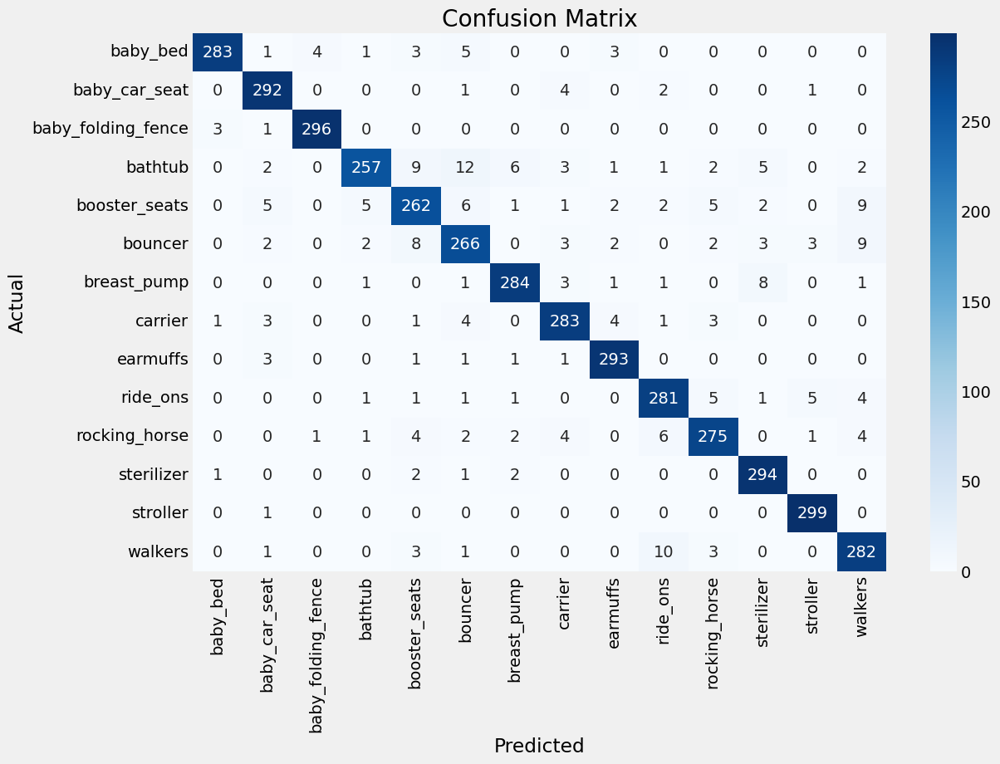

In [22]:
# Reset the validation generator
validation_generator.reset()

# Generate predictions
Y_pred = model.predict(validation_generator, steps=validation_generator.samples // validation_generator.batch_size + 1)
y_pred = np.argmax(Y_pred, axis=1)
y_true = validation_generator.classes

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred)
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

# Plot confusion matrix with rotated x-axis labels
plt.figure(figsize=(12, 8))
sns.heatmap(cm_df, annot=True, fmt="d", cmap='Blues')
plt.xticks(rotation=90)  # Rotate x-axis tick labels by 45 degrees
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

### **2. Classification Report**

In [23]:
y_val = validation_generator.classes
y_pred = model.predict(validation_generator)
y_pred = np.argmax(y_pred,axis=1)

132/132 [==============================] - 13s 96ms/step


In [24]:
print(classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       300
           1       0.94      0.97      0.96       300
           2       0.98      0.99      0.99       300
           3       0.96      0.86      0.90       300
           4       0.89      0.87      0.88       300
           5       0.88      0.89      0.89       300
           6       0.96      0.95      0.95       300
           7       0.94      0.94      0.94       300
           8       0.96      0.98      0.97       300
           9       0.92      0.94      0.93       300
          10       0.93      0.92      0.92       300
          11       0.94      0.98      0.96       300
          12       0.97      1.00      0.98       300
          13       0.91      0.94      0.92       300

    accuracy                           0.94      4200
   macro avg       0.94      0.94      0.94      4200
weighted avg       0.94      0.94      0.94      4200



### **3. Image Prediction Visualization**

In [25]:
class_indices = validation_generator.class_indices
indices = {v:k for k,v in class_indices.items()}

In [26]:
filenames = validation_generator.filenames

In [27]:
val_df = pd.DataFrame()
val_df['filename'] = filenames
val_df['actual'] = y_val
val_df['predicted'] = y_pred
val_df['actual'] = val_df['actual'].apply(lambda x: indices[x])
val_df['predicted'] = val_df['predicted'].apply(lambda x: indices[x])
val_df.loc[val_df['actual']==val_df['predicted'],'Same'] = True
val_df.loc[val_df['actual']!=val_df['predicted'],'Same'] = False
val_df.head(10)

,filename,actual,predicted,Same
0,baby_bed/baby_bed1.jpg,baby_bed,baby_bed,True
1,baby_bed/baby_bed10.jpg,baby_bed,baby_bed,True
2,baby_bed/baby_bed100.jpg,baby_bed,baby_bed,True
3,baby_bed/baby_bed101.jpg,baby_bed,baby_bed,True
4,baby_bed/baby_bed102.jpg,baby_bed,baby_bed,True
5,baby_bed/baby_bed103.jpg,baby_bed,baby_bed,True
6,baby_bed/baby_bed104.jpg,baby_bed,baby_bed,True
7,baby_bed/baby_bed105.jpg,baby_bed,baby_bed,True
8,baby_bed/baby_bed106.jpg,baby_bed,baby_bed,True
9,baby_bed/baby_bed107.jpg,baby_bed,baby_bed,True


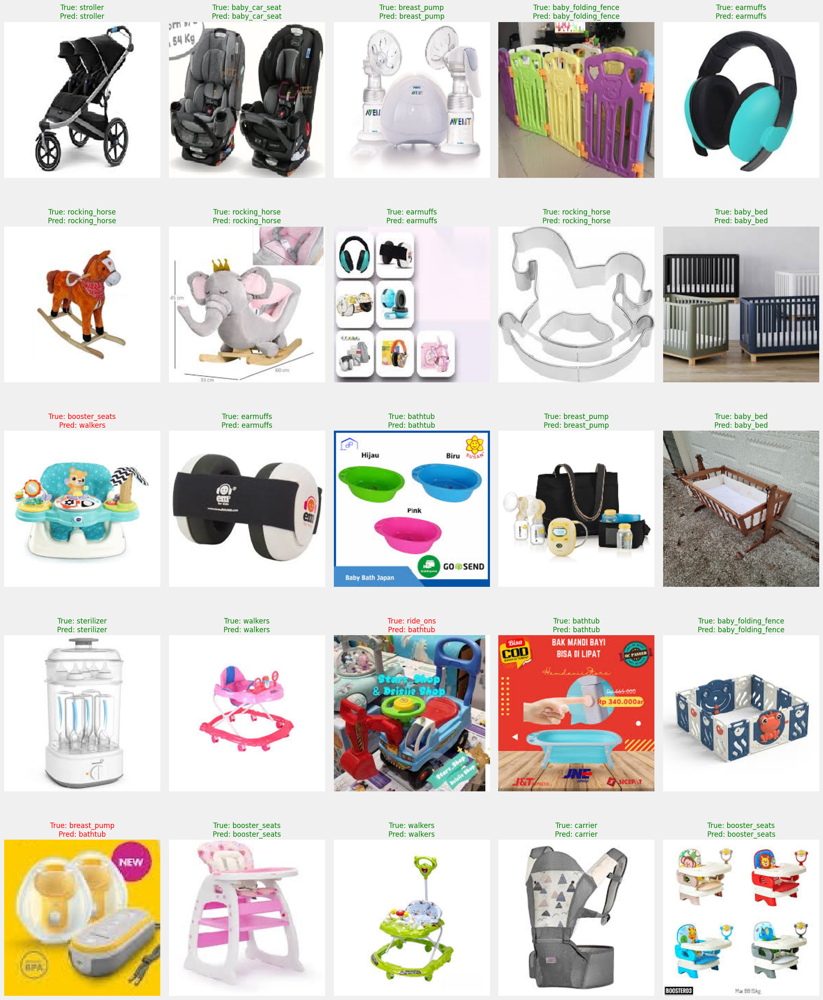

In [28]:
def plot_images(val_df, path, num_images=50):
    fig, axes = plt.subplots(5, num_images // 10, figsize=(20, 25))
    axes = axes.flatten()

    sample_df = val_df.sample(num_images)
    for ax, (_, row) in zip(axes, sample_df.iterrows()):
        img_path = os.path.join(path, row['filename'])
        img = load_img(img_path, target_size=(224, 224))
        img = img_to_array(img) / 255.0

        ax.imshow(img)
        ax.axis('off')
        title = f"True: {row['actual']}\nPred: {row['predicted']}"
        ax.set_title(title, fontsize=12, color="green" if row['Same'] else "red")

    plt.tight_layout()
    plt.show()

# Plot 50 images
plot_images(val_df, path, num_images=50)

# **Step 4 | Convert Model**

## **4.1 | Convert to TFJS**

In [29]:
model.save("model_tfjs.h5")

In [30]:
!pip install tensorflowjs
 
!tensorflowjs_converter --input_format=keras model_tfjs.h5 tfjs_model

INFO: pip is looking at multiple versions of tensorstore to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of tensorstore to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 27.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.0/124.0 kB 9.5 MB/s eta 0:00:00
  Attempting uninstall: tensorstore
    Found existing installation: tensorstore 0.1.56
    Uninstalling tensorstore-0.1.56:
      

In [33]:
import shutil
from IPython.display import FileLink

shutil.make_archive('/kaggle/working/tfjs_model', 'zip', '/kaggle/working/tfjs_model')

FileLink(r'/kaggle/working/tfjs_model.zip')

/kaggle/working/tfjs_model.zip

## **4.2 | Convert to TF-Serving**

In [31]:
save_path = os.path.join("models/rps_model/1/")
tf.saved_model.save(model, save_path)

In [32]:
shutil.make_archive('/kaggle/working/models', 'zip', '/kaggle/working/models')

FileLink(r'/kaggle/working/models.zip')

/kaggle/working/models.zip

## **4.2 | Convert to TF-Lite**

In [39]:
import tensorflow as tf

# Load the trained model
model = tf.keras.models.load_model('model_checkpoint.h5')

# Convert the model to TensorFlow Lite format
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the converted model to a .tflite file
with open('model.tflite', 'wb') as f:
    f.write(tflite_model)

Summary on the non-converted ops:
---------------------------------
 * Accepted dialects: tfl, builtin, func
 * Non-Converted Ops: 112, Total Ops 187, % non-converted = 59.89 %
 * 112 ARITH ops

- arith.constant:  112 occurrences  (f32: 110, i32: 2)



  (f32: 10)
  (f32: 36)
  (f32: 17)
  (f32: 2)
  (f32: 1)
  (f32: 4)
  (f32: 1)
  (f32: 1)
